In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pymongo import MongoClient
from datetime import datetime, timedelta
import numpy as np


In [9]:
from pymongo import MongoClient

def get_last_records(collection, num_records=5):
    """
    获取 MongoDB 集合中的最后 num_records 条数据。
    """
    # 查询按 `_id` 递减排序，限制为 num_records 条记录
    records = collection.find().sort('_id', -1).limit(num_records)
    return list(records)

if __name__ == "__main__":
    mongo_url = "mongodb://localhost:27017/"

    # 连接到 MongoDB
    client = MongoClient(mongo_url)
    db = client['交通类大数据']
    collection = db['深圳共享单车企业每日订单表']

    # 获取最后 5 条记录
    last_records = get_last_records(collection, num_records=5)

    # 打印结果
    for record in last_records:
        print(record)


{'_id': ObjectId('674319c05e7bf15895530b0e'), 'START_TIME': '2018-03-01 08:13:22.0', 'START_LAT': '22.551266', 'END_TIME': '2018-03-01 08:24:15.0', 'END_LNG': '114.11145675', 'USER_ID': '622b43eaed1a2e4023f0ce**********', 'START_LNG': '114.106415', 'END_LAT': '22.56266414', 'COM_ID': ''}
{'_id': ObjectId('674319c05e7bf15895530b0d'), 'START_TIME': '2018-03-01 08:12:07.0', 'START_LAT': '22.530138', 'END_TIME': '2018-03-01 08:15:20.0', 'END_LNG': '114.06826534', 'USER_ID': '8dfaf60a25faf80970453f**********', 'START_LNG': '114.070501', 'END_LAT': '22.53609117', 'COM_ID': ''}
{'_id': ObjectId('674319c05e7bf15895530b0c'), 'START_TIME': '2018-03-01 08:10:36.0', 'START_LAT': '22.533699', 'END_TIME': '2018-03-01 08:10:47.0', 'END_LNG': '114.06291358', 'USER_ID': '08db4b4cc2c1b20d9a8fe1**********', 'START_LNG': '114.063181', 'END_LAT': '22.53437121', 'COM_ID': ''}
{'_id': ObjectId('674319c05e7bf15895530b0b'), 'START_TIME': '2018-03-01 08:06:50.0', 'START_LAT': '22.50963677', 'END_TIME': '2018-03

In [ ]:
# 连接 MongoDB
mongo_url = "mongodb://localhost:27017/"
client = MongoClient(mongo_url)

try:
    client.admin.command('ping')
    print("MongoDB connection successful")
except Exception as e:
    print(f"MongoDB connection failed: {e}")
    exit()

# 选择数据库和集合
db = client['交通类大数据']
collection = db['深圳共享单车企业每日订单表']

MongoDB connection successful


In [4]:
# 定义查询的日期范围
start_date_str = "2021-08-23 00:00:00.0"
end_date_str = "2021-08-23 23:59:59.999"

# 查询特定日期的数据
query = {
    '$or': [
        {'START_TIME': {'$gte': start_date_str, '$lt': end_date_str}},
        {'END_TIME': {'$gte': start_date_str, '$lt': end_date_str}}
    ]
}

# 指定返回的字段：排除 '_id', 'USER_ID', 'COM_ID'
projection = {
    '_id': 0,        # 不包含 _id 字段
    'USER_ID': 0,    # 不包含 USER_ID 字段
    'COM_ID': 0      # 不包含 COM_ID 字段
}

# 查询数据并转为列表
data = list(collection.find(query, projection))


In [5]:
df = pd.DataFrame(data)
print(df.columns)  # 检查列名


Index(['START_TIME', 'START_LAT', 'END_TIME', 'END_LNG', 'START_LNG',
       'END_LAT'],
      dtype='object')


In [10]:
# 统计订单数量
order_count = len(data)

# 输出订单数量
print(f"订单数量：{order_count}")


订单数量：1700215


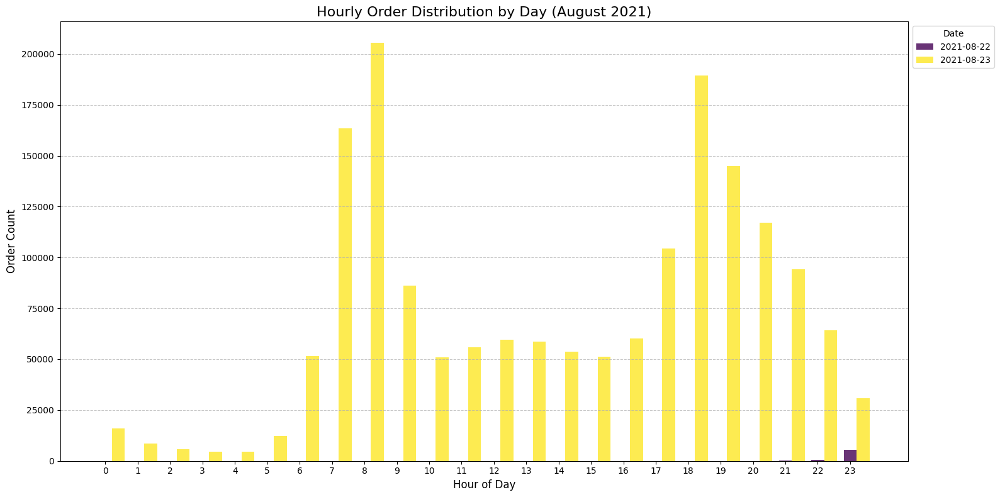

In [6]:
# Step 2: 转换为 Pandas DataFrame
df = pd.DataFrame(data)
if 'START_TIME' not in df.columns:
    print("No START_TIME field found in the data.")
    exit()

# 确保 START_TIME 是 datetime 类型
df['START_TIME'] = pd.to_datetime(df['START_TIME'])

# Step 3: 添加“日期”和“小时”列
df['Date'] = df['START_TIME'].dt.date  # 提取日期
df['Hour'] = df['START_TIME'].dt.hour  # 提取小时

# Step 4: 按日期和小时统计订单量
daily_hourly_counts = df.groupby(['Date', 'Hour']).size().unstack(fill_value=0)  # 创建日期-小时矩阵

# Step 5: 绘制多日柱状图
plt.figure(figsize=(16, 8))

# 定义颜色映射
colors = plt.cm.viridis(np.linspace(0, 1, len(daily_hourly_counts)))  # 生成不同颜色

# 遍历每天的数据，绘制柱状图
bar_width = 0.8 / len(daily_hourly_counts)  # 每个柱子的宽度（避免重叠）
for i, (date, hourly_data) in enumerate(daily_hourly_counts.iterrows()):
    x_positions = hourly_data.index + i * bar_width  # 偏移位置
    plt.bar(x_positions, hourly_data.values, width=bar_width, color=colors[i], alpha=0.8, label=str(date))

# 添加图例
plt.legend(title="Date", loc="upper left", bbox_to_anchor=(1, 1))

# 图表美化
plt.title('Hourly Order Distribution by Day (August 2021)', fontsize=16)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Order Count', fontsize=12)
plt.xticks(range(24))  # 固定 X 轴显示 0-23 小时
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 调整布局以避免图例遮挡图表
plt.tight_layout()

# 展示图表
plt.show()

In [14]:
# 转换为 DataFrame
df = pd.DataFrame(data)

# 转换时间字段为 datetime 类型
df['START_TIME'] = pd.to_datetime(df['START_TIME'])
df['END_TIME'] = pd.to_datetime(df['END_TIME'])

# 提取小时字段
df['START_HOUR'] = df['START_TIME'].dt.hour
df['END_HOUR'] = df['END_TIME'].dt.hour

In [15]:
import folium
from folium.plugins import HeatMap
import pandas as pd

In [16]:
# 创建地图中心点
m = folium.Map(location=[22.542883, 114.059226], zoom_start=12)

# 绘制每小时出发点和结束点的热力图
for hour in range(24):
    start_data = df[df['START_HOUR'] == hour]
    end_data = df[df['END_HOUR'] == hour]
    
    # 绘制出发点热力图
    if not start_data.empty:
        start_locations = list(zip(start_data['START_LAT'], start_data['START_LNG']))
        HeatMap(start_locations).add_to(m)
    
    # 绘制结束点热力图
    if not end_data.empty:
        end_locations = list(zip(end_data['END_LAT'], end_data['END_LNG']))
        HeatMap(end_locations).add_to(m)

    # 保存每小时地图
    m.save(f"bike_heatmap_hour_{hour}.html")

In [ ]:
import pandas as pd

# 将查询结果转化为 DataFrame
df = pd.DataFrame(data)

# 随机抽样 5000 个数据点
sampled_data = df.sample(n=5000)


In [41]:
import pandas as pd

# 假设 sampled_data 是已经抽样的数据
# 将抽样数据保存为 CSV 文件
sampled_data.to_csv('shenzhen_bike_sampled_data.csv', index=False, encoding='utf-8')


In [2]:
import pandas as pd

# 从 CSV 文件读取数据
sampled_data = pd.read_csv('shenzhen_bike_sampled_data.csv', encoding='utf-8')

# 查看前几行数据以确认读取是否正确
print(sampled_data.head())


              START_TIME  START_LAT               END_TIME     END_LNG  \
0  2021-08-23 22:32:36.0  22.505471  2021-08-23 22:38:48.0  114.059111   
1  2021-08-23 11:18:19.0  22.567124  2021-08-23 11:22:57.0  113.898940   
2  2021-08-23 20:36:40.0  22.547990  2021-08-23 20:43:16.0  114.127237   
3  2021-08-23 07:47:40.0  22.558145  2021-08-23 07:52:32.0  113.912273   
4  2021-08-23 08:15:13.0  22.648109  2021-08-23 08:21:15.0  114.047579   

    START_LNG    END_LAT  
0  114.054354  22.510074  
1  113.894598  22.570769  
2  114.122130  22.549359  
3  113.912454  22.551769  
4  114.051452  22.647127  


In [3]:
print(sampled_data.columns)  # 检查列名

Index(['START_TIME', 'START_LAT', 'END_TIME', 'END_LNG', 'START_LNG',
       'END_LAT'],
      dtype='object')


In [4]:
import folium
from folium.plugins import MarkerCluster

# 假设 `sampled_data` 是你的抽样数据，包含 'START_LAT', 'START_LNG', 'END_LAT', 'END_LNG'
start_latitudes = sampled_data['START_LAT']
start_longitudes = sampled_data['START_LNG']
end_latitudes = sampled_data['END_LAT']
end_longitudes = sampled_data['END_LNG']

# 创建深圳地图（设置地图中心为深圳市的经纬度）
m = folium.Map(location=[22.5431, 114.0579], zoom_start=12)

# 创建 MarkerCluster 用于聚类标记
marker_cluster = MarkerCluster().add_to(m)

# 绘制出发点的散点图（使用蓝色标记）
for lat, lng in zip(start_latitudes, start_longitudes):
    folium.CircleMarker(
        location=[lat, lng],
        radius=5,
        color='blue',  # 蓝色标记
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(marker_cluster)

# 绘制结束点的散点图（使用红色标记）
for lat, lng in zip(end_latitudes, end_longitudes):
    folium.CircleMarker(
        location=[lat, lng],
        radius=5,
        color='red',  # 红色标记
        fill=True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(marker_cluster)

# 保存地图为 HTML 文件
m.save('shenzhen_bike_start_end_map.html')


In [5]:
m

In [25]:
import pandas as pd

# 从 CSV 文件读取数据
sampled_data = pd.read_csv('shenzhen_bike_sampled_data.csv', encoding='utf-8')

# 查看前几行数据以确认读取是否正确
print(sampled_data.head())

              START_TIME  START_LAT               END_TIME     END_LNG  \
0  2021-08-23 22:32:36.0  22.505471  2021-08-23 22:38:48.0  114.059111   
1  2021-08-23 11:18:19.0  22.567124  2021-08-23 11:22:57.0  113.898940   
2  2021-08-23 20:36:40.0  22.547990  2021-08-23 20:43:16.0  114.127237   
3  2021-08-23 07:47:40.0  22.558145  2021-08-23 07:52:32.0  113.912273   
4  2021-08-23 08:15:13.0  22.648109  2021-08-23 08:21:15.0  114.047579   

    START_LNG    END_LAT  
0  114.054354  22.510074  
1  113.894598  22.570769  
2  114.122130  22.549359  
3  113.912454  22.551769  
4  114.051452  22.647127  


In [26]:
import pandas as pd
import numpy as np
from geopy.distance import geodesic

# 假设已经从CSV读取了数据
sampled_data = pd.read_csv('shenzhen_bike_sampled_data.csv', encoding='utf-8')

# 定义深圳的经纬度范围（大致范围）
min_lat, max_lat = 22.5, 22.8
min_lng, max_lng = 113.8, 114.3

# 网格大小（单位：米），例如 1000米 x 1000米
grid_size = 1000

# 经纬度与米之间的近似转换（考虑到地球曲率，这只是一个粗略的转换）
lat_to_meter = 111320  # 每纬度对应的米数（接近赤道）
lng_to_meter = 111320 * np.cos(np.radians((max_lat + min_lat) / 2))  # 经度的变化

# 计算网格的横纵坐标（以米为单位）
num_lat_grid = int((max_lat - min_lat) * lat_to_meter / grid_size)
num_lng_grid = int((max_lng - min_lng) * lng_to_meter / grid_size)

# 将每个出发点坐标转换为网格
def get_grid_id(lat, lng):
    # 转换经纬度到以米为单位的坐标
    x = (lng - min_lng) * lng_to_meter
    y = (lat - min_lat) * lat_to_meter
    
    # 计算出该点属于哪个网格
    grid_x = int(x // grid_size)
    grid_y = int(y // grid_size)
    
    return grid_x, grid_y

# 创建一个字典，保存每个网格的出发点数量
grid_counts = {}

# 遍历所有的出发点，计算其所属网格
for _, row in sampled_data.iterrows():
    start_lat, start_lng = row['START_LAT'], row['START_LNG']
    
    grid_x, grid_y = get_grid_id(start_lat, start_lng)
    
    # 记录该网格中的出发点数量
    if (grid_x, grid_y) not in grid_counts:
        grid_counts[(grid_x, grid_y)] = 0
    grid_counts[(grid_x, grid_y)] += 1

# 将网格和出发点数量转换为 DataFrame 进行展示
grid_df = pd.DataFrame(list(grid_counts.items()), columns=['Grid', 'Start_Point_Count'])
grid_df[['Grid_X', 'Grid_Y']] = pd.DataFrame(grid_df['Grid'].tolist(), index=grid_df.index)
grid_df = grid_df.drop(columns=['Grid'])

# 打印前几行结果
print(grid_df.head())


   Start_Point_Count  Grid_X  Grid_Y
0                 21      26       0
1                 23       9       7
2                 31      33       5
3                  7      11       6
4                  7      25      16


C:\Users\MOMO\AppData\Local\Temp\ipykernel_25148\1767365889.py:62: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


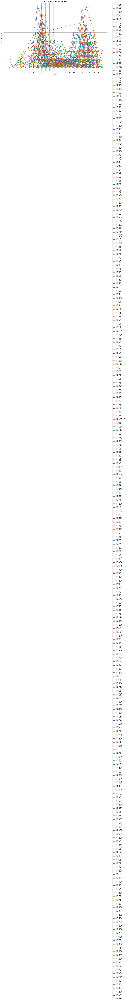

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 假设已读取数据
sampled_data = pd.read_csv('shenzhen_bike_sampled_data.csv', encoding='utf-8')

# 确保出发时间是日期时间格式
sampled_data['START_TIME'] = pd.to_datetime(sampled_data['START_TIME'])

# 计算每个出发点所在的网格
def get_grid_id(lat, lng):
    x = (lng - min_lng) * lng_to_meter
    y = (lat - min_lat) * lat_to_meter
    grid_x = int(x // grid_size)
    grid_y = int(y // grid_size)
    return grid_x, grid_y

# 定义深圳的经纬度范围（大致范围）
min_lat, max_lat = 22.5, 22.8
min_lng, max_lng = 113.8, 114.3

# 网格大小（单位：米）
grid_size = 1000

# 经纬度与米之间的近似转换（考虑到地球曲率）
lat_to_meter = 111320
lng_to_meter = 111320 * np.cos(np.radians((max_lat + min_lat) / 2))

# 给每个出发点分配网格
sampled_data['Grid_X'], sampled_data['Grid_Y'] = zip(*sampled_data.apply(lambda row: get_grid_id(row['START_LAT'], row['START_LNG']), axis=1))

# 按时间提取小时，便于分组
sampled_data['Hour'] = sampled_data['START_TIME'].dt.hour

# 创建图形对象
plt.figure(figsize=(15, 10))

# 获取所有独特的网格
unique_grids = sampled_data[['Grid_X', 'Grid_Y']].drop_duplicates()

# 为每个网格绘制曲线
for _, grid in unique_grids.iterrows():
    grid_x, grid_y = grid['Grid_X'], grid['Grid_Y']
    
    # 过滤出该网格的所有出发点数据
    grid_data = sampled_data[(sampled_data['Grid_X'] == grid_x) & (sampled_data['Grid_Y'] == grid_y)]
    
    # 按小时统计出发点数量
    time_series = grid_data.groupby('Hour').size()
    
    # 绘制该网格的时间曲线
    plt.plot(time_series.index, time_series.values, marker='o', linestyle='-', label=f'Grid ({grid_x}, {grid_y})')

# 添加图例和标签
plt.title('Start Points in All Grids by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Start Points')
plt.legend(title='Grid', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
plt.grid(True)
plt.xticks(np.arange(0, 24, 1))
plt.tight_layout()
plt.show()


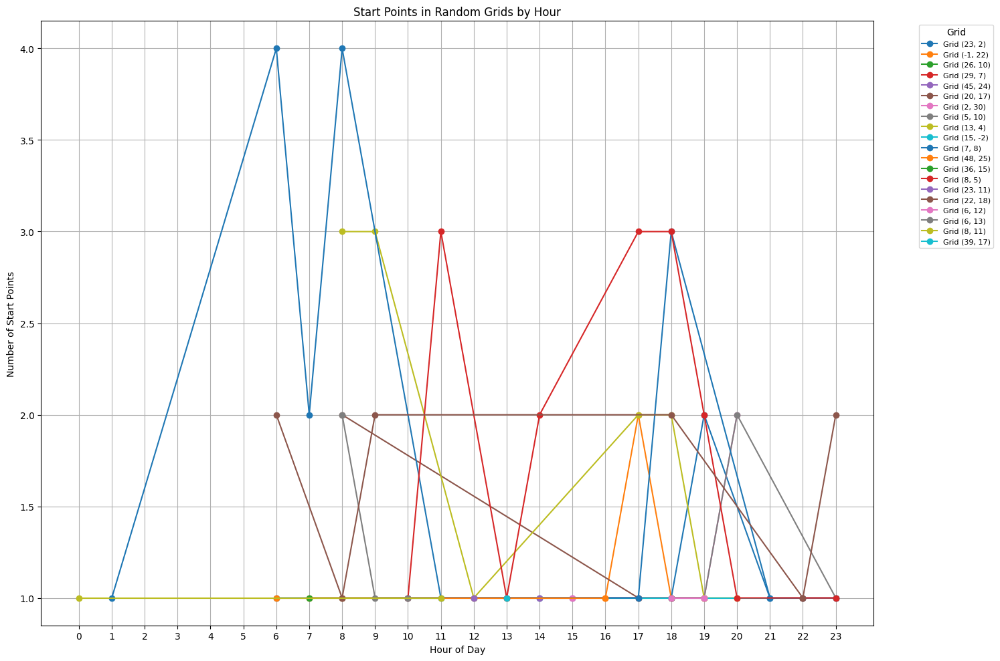

In [34]:
# 随机选择几个网格，假设选择 5 个网格
sampled_grids = unique_grids.sample(n=20, random_state=42)  # 随机选择5个网格

# 创建图形对象
plt.figure(figsize=(15, 10))

# 为每个随机选择的网格绘制曲线
for _, grid in sampled_grids.iterrows():
    grid_x, grid_y = grid['Grid_X'], grid['Grid_Y']
    
    # 过滤出该网格的所有出发点数据
    grid_data = sampled_data[(sampled_data['Grid_X'] == grid_x) & (sampled_data['Grid_Y'] == grid_y)]
    
    # 按小时统计出发点数量
    time_series = grid_data.groupby('Hour').size()
    
    # 绘制该网格的时间曲线
    plt.plot(time_series.index, time_series.values, marker='o', linestyle='-', label=f'Grid ({grid_x}, {grid_y})')

# 添加图例和标签
plt.title('Start Points in Random Grids by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Start Points')
plt.legend(title='Grid', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
plt.grid(True)
plt.xticks(np.arange(0, 24, 1))
plt.tight_layout()
plt.show()

In [42]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances
import folium
import matplotlib.pyplot as plt
from geopy.distance import geodesic
from matplotlib import colors  # 导入 matplotlib.colors

# 假设已读取数据
sampled_data = pd.read_csv('shenzhen_bike_sampled_data.csv', encoding='utf-8')

# 确保出发时间是日期时间格式
sampled_data['START_TIME'] = pd.to_datetime(sampled_data['START_TIME'])

# 定义深圳的经纬度范围（大致范围）
min_lat, max_lat = 22.5, 22.8
min_lng, max_lng = 113.8, 114.3

# 网格大小（单位：米）
grid_size = 1000

# 经纬度与米之间的近似转换（考虑到地球曲率）
lat_to_meter = 111320
lng_to_meter = 111320 * np.cos(np.radians((max_lat + min_lat) / 2))

# 计算每个出发点所在的网格
def get_grid_id(lat, lng):
    x = (lng - min_lng) * lng_to_meter
    y = (lat - min_lat) * lat_to_meter
    grid_x = int(x // grid_size)
    grid_y = int(y // grid_size)
    return grid_x, grid_y

# 给每个出发点分配网格
sampled_data['Grid_X'], sampled_data['Grid_Y'] = zip(*sampled_data.apply(lambda row: get_grid_id(row['START_LAT'], row['START_LNG']), axis=1))

# 按时间提取小时，便于分组
sampled_data['Hour'] = sampled_data['START_TIME'].dt.hour

# 为每个网格绘制时间序列
grid_time_series = []
grid_coords = []

# 获取所有独特的网格
unique_grids = sampled_data[['Grid_X', 'Grid_Y']].drop_duplicates()

# 提取每个网格的时间序列数据
for _, grid in unique_grids.iterrows():
    grid_x, grid_y = grid['Grid_X'], grid['Grid_Y']
    
    # 过滤出该网格的所有出发点数据
    grid_data = sampled_data[(sampled_data['Grid_X'] == grid_x) & (sampled_data['Grid_Y'] == grid_y)]
    
    # 按小时统计出发点数量
    time_series = grid_data.groupby('Hour').size().reindex(np.arange(24), fill_value=0).values
    grid_time_series.append(time_series)  # 存储时间序列
    
    # 获取该网格的经纬度中心点
    center_lat = grid_data['START_LAT'].mean()
    center_lng = grid_data['START_LNG'].mean()
    grid_coords.append((center_lat, center_lng))

# 将时间序列转换为 NumPy 数组
grid_time_series = np.array(grid_time_series)

# 计算时间序列之间的相似性（欧几里得距离）
time_series_distance = pairwise_distances(grid_time_series, metric='euclidean')

# 计算网格之间的空间距离（使用经纬度）
def calculate_distance(coord1, coord2):
    return geodesic(coord1, coord2).meters

# 计算所有网格间的空间距离矩阵
spatial_distance = np.zeros((len(grid_coords), len(grid_coords)))
for i, coord1 in enumerate(grid_coords):
    for j, coord2 in enumerate(grid_coords):
        spatial_distance[i, j] = calculate_distance(coord1, coord2)

# 合并时间序列相似性和空间距离（加权和）
alpha = 0.5  # 权重，可以根据需要调整
combined_distance = alpha * time_series_distance + (1 - alpha) * spatial_distance

# 使用 KMeans 聚类算法将网格分成若干区域
kmeans = KMeans(n_clusters=20, random_state=42)  # 假设分为 20 个区域
labels = kmeans.fit_predict(combined_distance)

# 在深圳地图上显示区域划分
map_center = [22.6, 114.1]  # 深圳中心坐标
m = folium.Map(location=map_center, zoom_start=12)

# 为每个网格绘制区域
for idx, (coord, cluster) in enumerate(zip(grid_coords, labels)):
    lat, lng = coord
    # 每个区域使用不同颜色
    color = plt.cm.get_cmap('tab20', 20)(cluster / 20)[:3]
    
    # 将 RGB 转换为 HEX 格式
    hex_color = colors.to_hex(color)
    
    # 绘制圆圈表示网格位置
    folium.CircleMarker(
        location=(lat, lng),
        radius=10,
        color=hex_color,
        fill=True,
        fill_opacity=0.6,
        popup=f'Cluster {cluster}'
    ).add_to(m)

# 显示地图
m.save('shenzhen_bike_clusters_map.html')


C:\Users\MOMO\AppData\Local\Temp\ipykernel_25148\302459875.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color = plt.cm.get_cmap('tab20', 20)(cluster / 20)[:3]


In [43]:
m

C:\Users\MOMO\AppData\Local\Temp\ipykernel_25148\2546839122.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', 20)


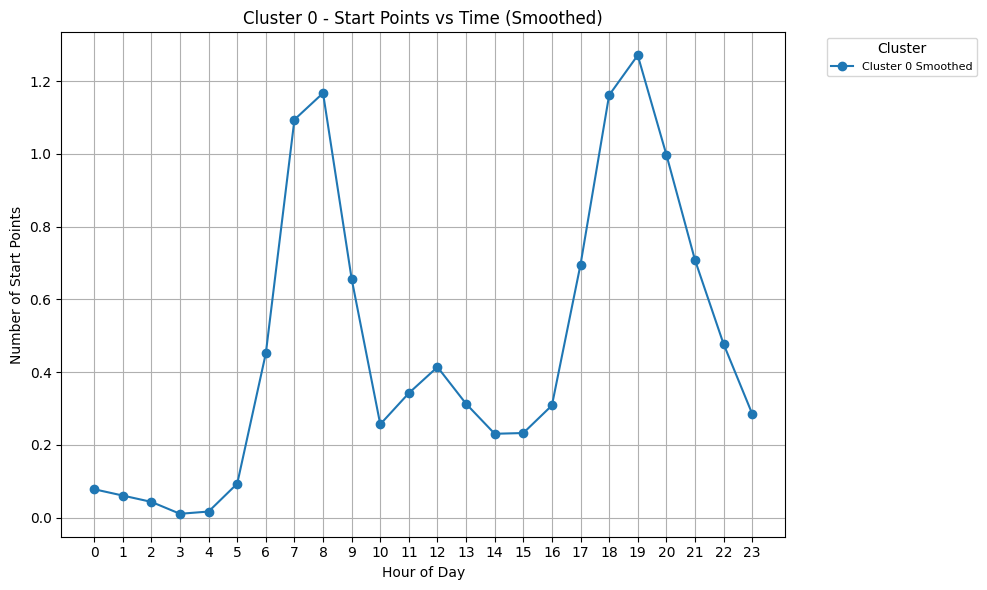

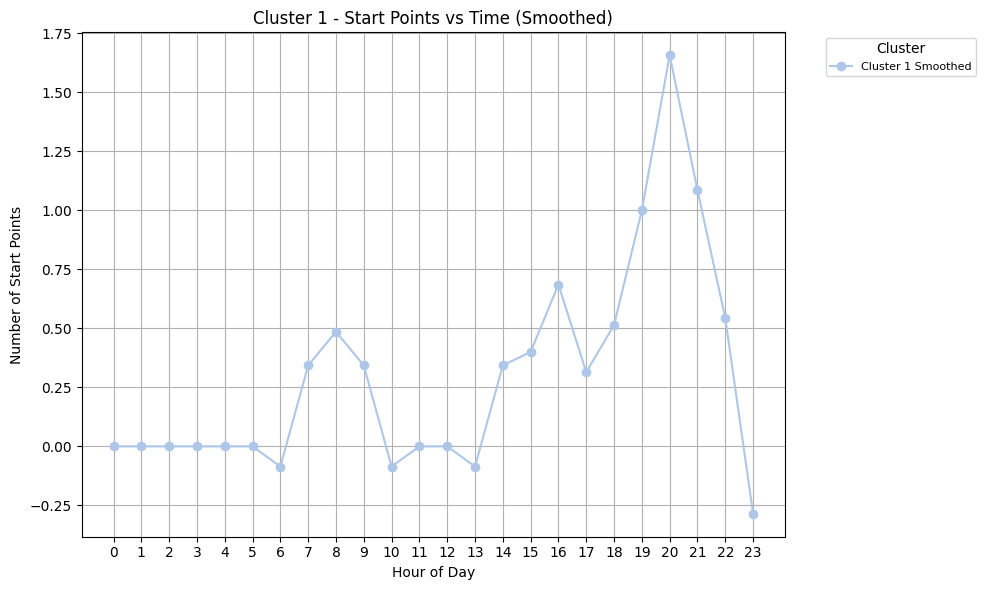

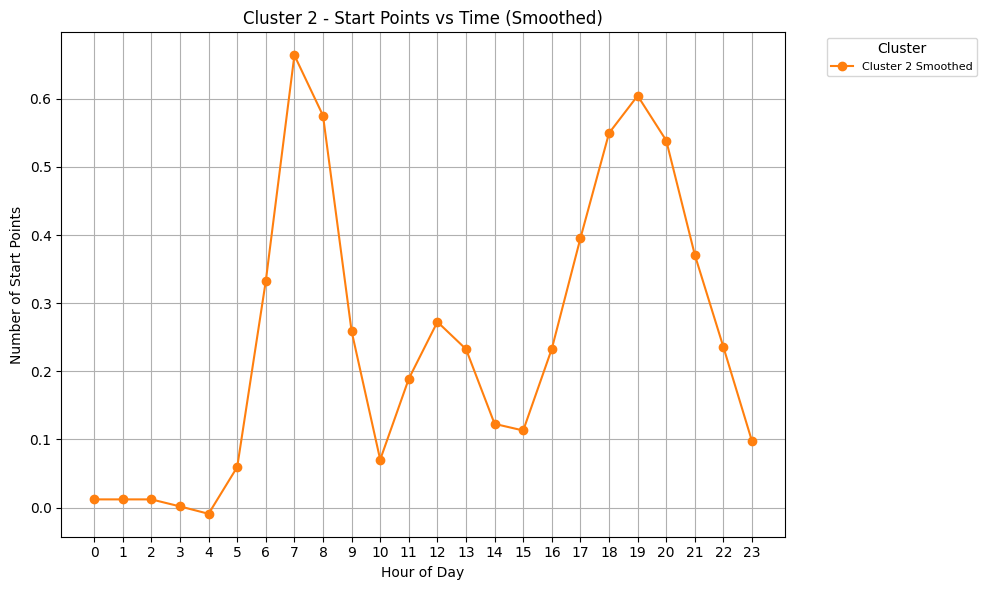

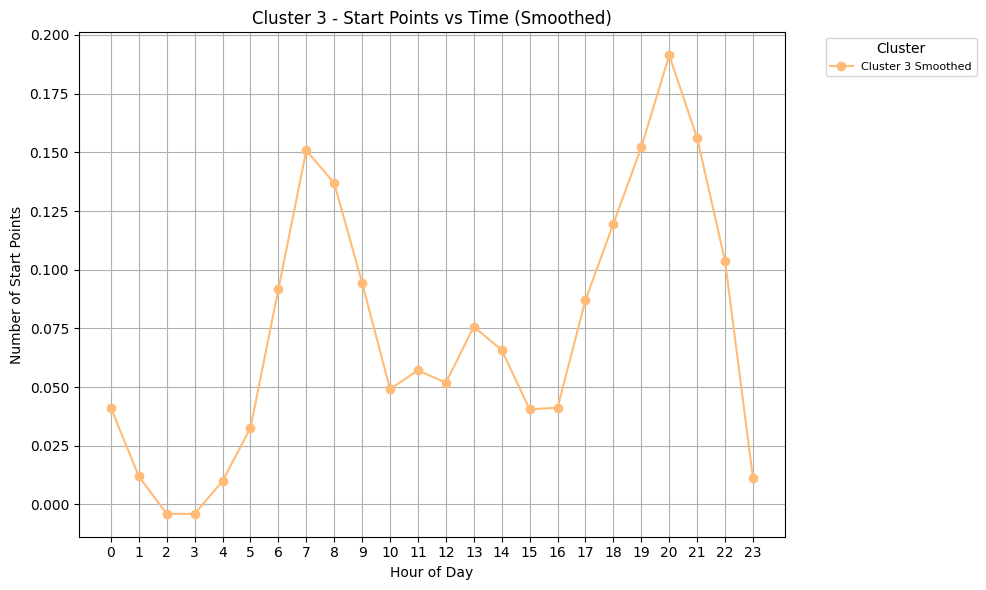

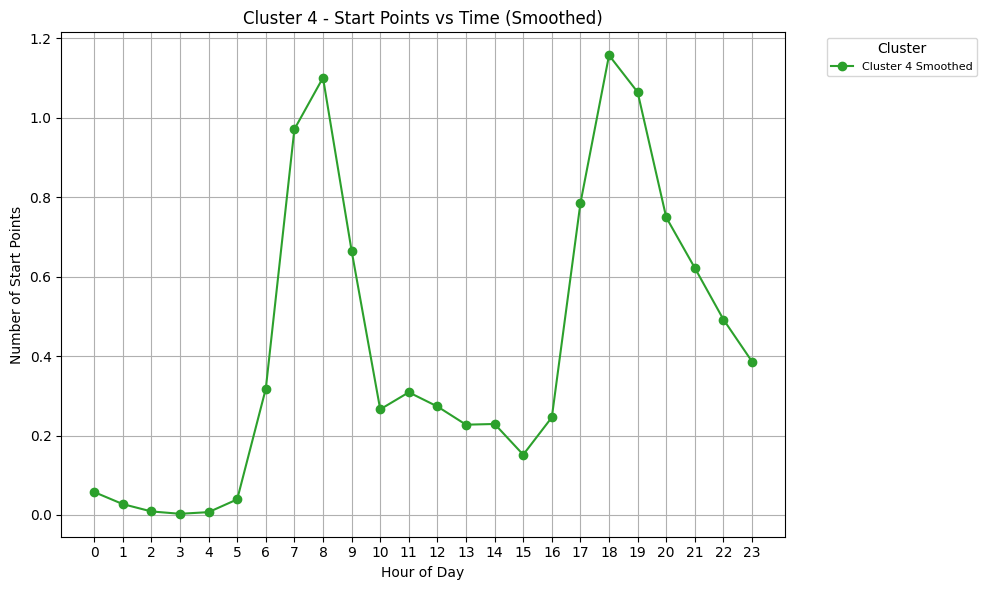

...

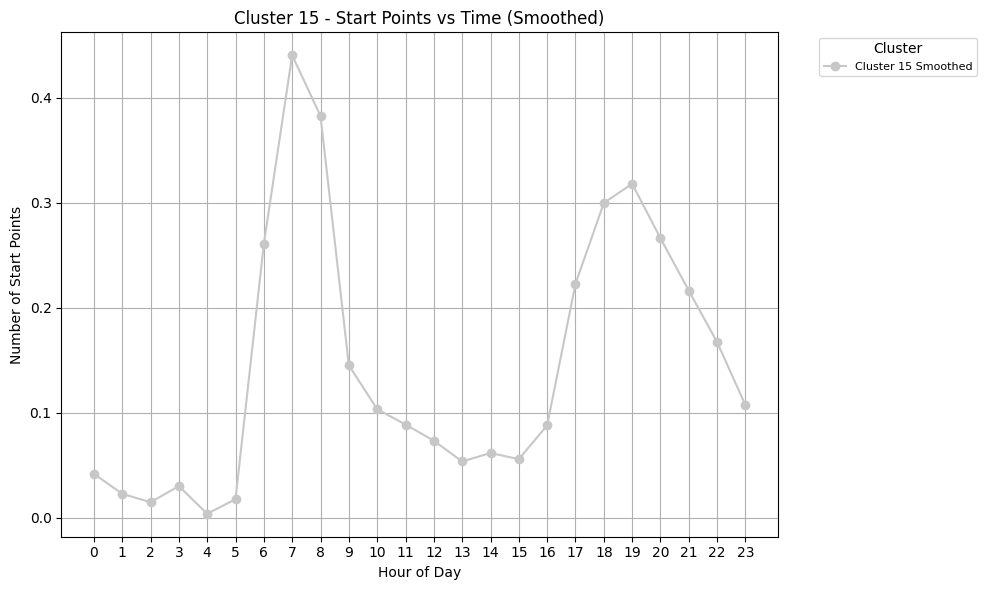

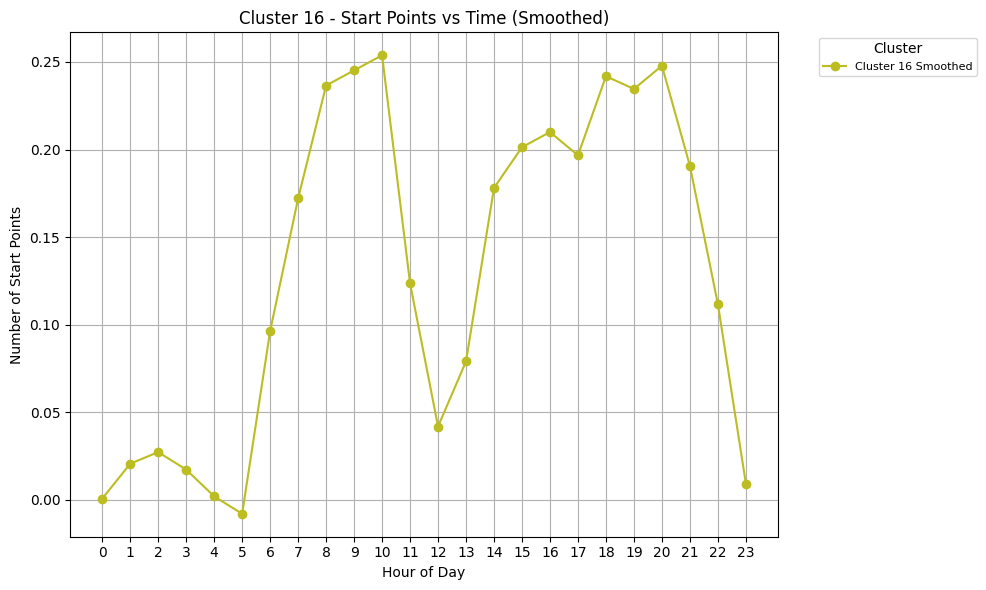

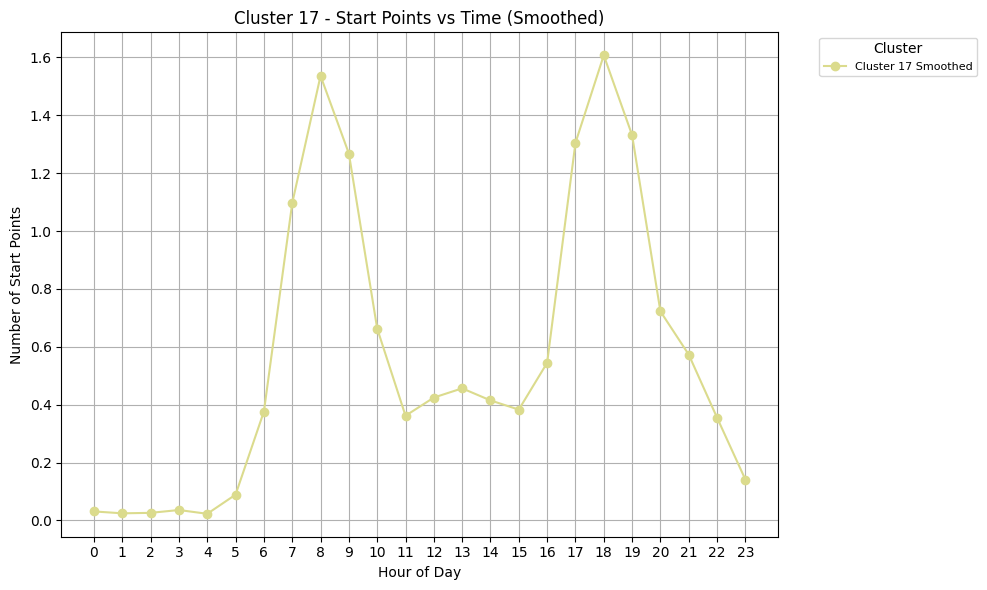

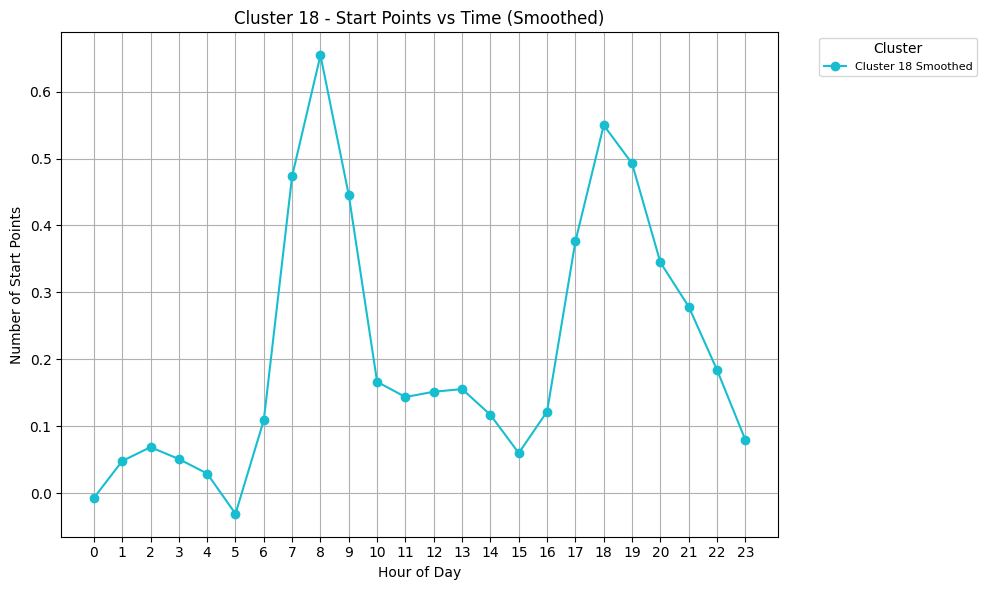

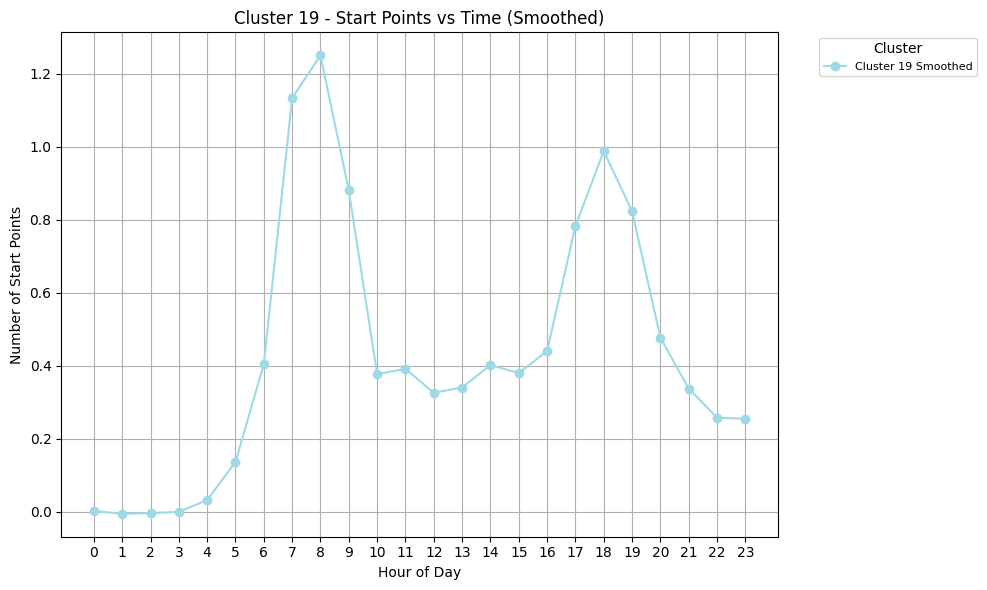

In [45]:
from scipy.interpolate import make_interp_spline  # 用于平滑曲线
from scipy.signal import savgol_filter  # 使用Savitzky-Golay滤波器平滑数据
import matplotlib.pyplot as plt

# 假设已经进行了聚类并得到了 labels 和 cluster_color（对应的颜色）

# 假设这里有 20 种颜色对应聚类区域
colors = plt.cm.get_cmap('tab20', 20)

# 绘制每个区域的出发点与时间关系图并拟合成光滑曲线
for cluster_label in np.unique(labels):
    plt.figure(figsize=(10, 6))
    plt.title(f'Cluster {cluster_label} - Start Points vs Time (Smoothed)')
    plt.xlabel('Hour of Day')
    plt.ylabel('Number of Start Points')
    
    # 选择该区域内的所有网格
    cluster_grids = unique_grids[labels == cluster_label]
    
    # 对每个网格的时间序列拟合并绘制光滑曲线
    all_time_series = []
    for _, grid in cluster_grids.iterrows():
        grid_x, grid_y = grid['Grid_X'], grid['Grid_Y']
        
        # 过滤出该网格的所有出发点数据
        grid_data = sampled_data[(sampled_data['Grid_X'] == grid_x) & (sampled_data['Grid_Y'] == grid_y)]
        
        # 按小时统计出发点数量
        time_series = grid_data.groupby('Hour').size().reindex(np.arange(24), fill_value=0).values
        all_time_series.append(time_series)
    
    # 计算每个小时所有网格的平均出发点数量
    avg_time_series = np.mean(all_time_series, axis=0)
    
    # 使用 Savitzky-Golay 滤波器进行平滑
    smoothed_series = savgol_filter(avg_time_series, window_length=5, polyorder=2)
    
    # 选择对应 cluster_label 的颜色
    cluster_color = colors(cluster_label / 20)[:3]  # 将 cluster_label 映射到颜色

    # 绘制光滑曲线
    plt.plot(np.arange(24), smoothed_series, marker='o', linestyle='-', color=cluster_color, label=f'Cluster {cluster_label} Smoothed')
    
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    plt.grid(True)
    plt.xticks(np.arange(0, 24, 1))
    plt.tight_layout()
    plt.show()
